# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Read an image using OpenCV (Use your own image).

(-0.5, 5615.5, 3743.5, -0.5)

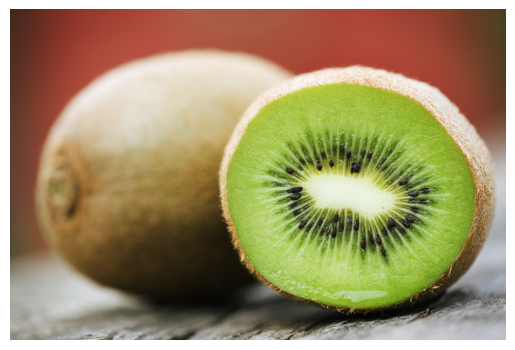

In [2]:
### START CODE HERE ###
img = cv2.imread('images/kiwi2.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off')
plt.show()
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [3]:
#norm
def norm(img):
    min_val = np.min(img)
    max_val = np.max(img)
    
    # Avoid division by zero
    if max_val != min_val:
        normalized_image = (img - min_val) / (max_val - min_val)
    else:
        normalized_image = img * 0.0 
    
    return normalized_image

In [4]:
### START CODE HERE ###
num_steps = 20
# a = np.linspace(0, 0.9, num_steps)
# a = np.linspace(0, 0.9, num_steps)
a = 0
b = 0
lin_result = []

norm_img = norm(img)
print("norm")
print(norm_img[11])

for i in range(20):
    # I_new = ((img.astype(float) * a + b) * 255).astype(np.uint8)
    I_new = np.clip((norm_img.astype(float) * a + b) * 255, 0, 255).astype(np.uint8)
    lin_result.append(I_new)
    a += 0.1 #[0,2]
    b += 0.04 #[0,0.8]
print("result")
print(lin_result[11])
### END CODE HERE ###

norm
[[0.24705882 0.15294118 0.11372549]
 [0.24705882 0.15294118 0.11372549]
 [0.24705882 0.15294118 0.11372549]
 ...
 [0.2627451  0.23921569 0.1372549 ]
 [0.2627451  0.24705882 0.14117647]
 [0.2627451  0.24705882 0.14117647]]


Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


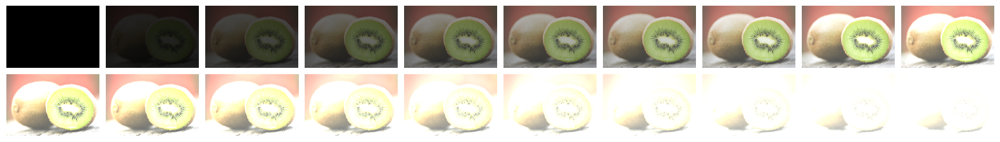

In [ ]:
### START CODE HERE ###
fig = plt.figure(figsize=(20, 10))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 10),  # Number of rows and columns for grid
                 axes_pad=0.1,  # Space between images
                 )

# Add each image corresponding to lin_result to ImageGrid
for ax, img in zip(grid, lin_result):
    ax.imshow(img)
    ax.axis('off')  # Turn off axes

plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [ ]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [ ]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    # Get height and width from the first image in the array
    height, width, _ = image_array[0].shape

    # Initialize video writer with codec and frame rate
    fourcc = cv2.VideoWriter_fourcc(*'avc1')  # Change codec as necessary
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    # Write each frame to the video file
    for frame in image_array:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        out.write(frame_rgb)

    # Release resources
    out.release()
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [ ]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result, output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [ ]:
%%capture
### START CODE HERE ###
# Create figure and axis
fig, ax = plt.subplots()
artists = []

# # Function to animate each frame
def animate(i):
    img = ax.imshow(lin_result[i])
    return (img,)

# # Add frames to animation
for i in range(len(lin_result)):
    artists.append(animate(i))

# Initialize empty ArtistAnimation
ani = animation.ArtistAnimation(fig=fig, artists=artists, interval=400)

plt.show()
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [ ]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 20 iterations*** for 0 < $\gamma$ < 2 and another ***at least 20 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


In [ ]:
### START CODE HERE ###
a = 1 # Scaling factor
b = 0 # Brightness adjustment
gamma = 0.1

gam_result = []

# Iterate for 0 < gamma < 1
for i in range(10):
    gamma = 0.1 * (i + 1)  # gamma ranges from 0.1 to 1.0 incrementally
    I_new = np.clip(((norm_img.astype(float) ** gamma) * a + b)* 255, 0, 255).astype(np.uint8)
    gam_result.append(I_new)

# Iterate for gamma > 1
for i in range(10):
    gamma = 1.1 + 0.1 * (i + 1)  # gamma ranges from 1.1 to 2.0 incrementally
    # I_new = np.clip((img.astype(float) ** gamma) * a + b, 0, 255).astype(np.uint8)
    I_new = np.clip(((norm_img.astype(float) ** gamma) * a + b)* 255, 0, 255).astype(np.uint8)
    gam_result.append(I_new)

print(gam_result)
### END CODE HERE ###

[array([[[221, 210, 204],
        [221, 210, 204],
        [221, 210, 204],
        ...,
        [222, 221, 207],
        [222, 221, 207],
        [223, 221, 207]],

       [[221, 210, 204],
        [221, 210, 204],
        [221, 210, 204],
        ...,
        [223, 221, 207],
        [222, 221, 207],
        [222, 221, 207]],

       [[221, 210, 204],
        [221, 210, 203],
        [221, 210, 203],
        ...,
        [223, 221, 208],
        [223, 221, 208],
        [223, 221, 208]],

       ...,

       [[242, 240, 239],
        [242, 240, 239],
        [242, 240, 239],
        ...,
        [247, 247, 248],
        [247, 247, 248],
        [247, 247, 248]],

       [[242, 241, 239],
        [242, 240, 239],
        [242, 240, 239],
        ...,
        [247, 247, 248],
        [247, 247, 248],
        [247, 247, 248]],

       [[242, 241, 240],
        [242, 241, 239],
        [242, 240, 239],
        ...,
        [247, 247, 248],
        [247, 247, 248],
        [247, 247, 248]

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

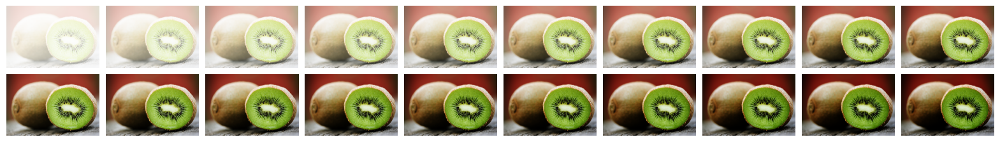

In [ ]:
### START CODE HERE ###
fig = plt.figure(figsize=(20, 10))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 10),  # Number of rows and columns for grid
                 axes_pad=0.1,  # Space between images
                 )

# Add each image corresponding to lin_result to ImageGrid
for ax, img in zip(grid, gam_result):
    ax.imshow(img)
    ax.axis('off')  # Turn off axes

plt.show()
### END CODE HERE ###

In [ ]:
assert len(gam_result) == 20, f"Expected {20} iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [ ]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [ ]:
%%capture
### START CODE HERE ###
# Create figure and axis
fig, ax = plt.subplots()
artists = []

# # Function to animate each frame
def animate(i):
    img = ax.imshow(gam_result[i])
    return (img,)

# # Add frames to animation
for i in range(len(gam_result)):
    artists.append(animate(i))

# Initialize empty ArtistAnimation
ani = animation.ArtistAnimation(fig=fig, artists=artists, interval=400)

plt.show()
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://github.com/Digital-Image-Processing-Laboratory/image_processing-2024/blob/master/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [ ]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process

## **Answers**
1.  <b>Over-brightness:</b><br/>
    - ลด b: brightness (offset) จากสมการ linear/gamma equation -> shift ความสว่างของกราฟลงมา<br/>
    - ปรับ Brightness/Contrast: ลดระดับความสว่าง ทำให้แสงโดยรวมในภาพดูสว่างน้อยลง<br/>
    - ปรับ Levels/Curves: เพื่อปรับระดับสีของภาพ ซึ่งช่วยควบคุมความสว่าง ความคมชัด และโทนสีของภาพได้<br/>
    <b>Over-saturation: ค่าความเข้มของแสงในภาพสูงเกินกว่าที่ระบบแสดงผลสามารถแสดงได้</b><br/>
    - ลดค่า a: intensity (ความชันของกราฟ) จะทำให้ภาพโดยรวมมืดลง -> ลดความชันของกราฟ<br/>
    - ปรับ Hue/Saturation: ปรับโทนสี/ความอิ่มตัว โดยประบลดระดับความอิ่มตัวลง เพื่อลดความเข้มข้นของสี<br/>
    - Selective Desaturation: กำหนดเป้าหมายสี/พื้นที่เฉพาะส่วน เพื่อลดความอิ่มตัวบริเวณนั้น เพื่อรักษาส่วนอื่นๆให้คงสภาพเดิมไว้<br/>
    ลด b
    <br/>
2. ปรับค่าแต่ละพิกเซลในภาพ โดยมีกระบวนการดังนี้<br/>
    1. วนลูปผ่านแต่ละพิกเซล และคำนวณค่าพิกเซลใหม่โดยใช้สูตร<br/>
        <b>ค่าใหม่ = ค่าสูงสุด - ค่าเดิม</b> <br/>
        โดยที่ "ค่าสูงสุด" คือค่าสีสูงสุดที่เป็นไปได้ (255 สำหรับสีขาว) และ "ค่าเดิม" คือค่าสีของพิกเซลนั้น<br/>
    2. นำค่าพิกเซลใหม่ที่ได้จากการคำนวนแทนที่จุดสีภาพเดิม เมื่อทำทั้งหมดของภาพจะได้ภาพที่เป็นการ reverse intensity เดิมนั้นเอง<br/>
